##Análise Abrangente do Risco de Doenças

Resumo do Projeto

O objetivo deste projeto é desenvolver um modelo de machine learning para prever o risco de um indivíduo ser classificado como "doente" ou "saudável" com base em 48 indicadores de estilo de vida, demográficos e biométricos. Para isso, foi utilizado um modelo de Árvore de Decisão, que oferece alta interpretabilidade sobre os fatores que mais influenciam o diagnóstico.

##Import das Bibliotecas

In [0]:
from pyspark.sql import SparkSession
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")


##1. Extração e Carga dos Dados

A primeira etapa do projeto consistiu na extração dos dados brutos da base df_risco_doenca, que se encontrava em um ambiente Spark. Para isso, foi utilizada uma consulta SQL que selecionou as principais variáveis relevantes ao risco de doenças, abrangendo características:

Demográficas: idade, gênero, nível educacional, ocupação, renda;

Antropométricas e clínicas: altura, peso, IMC, circunferência da cintura, pressão arterial, frequência cardíaca, colesterol, glicose, insulina;

Hábitos de vida: sono, trabalho, atividade física, alimentação, tabagismo, consumo de álcool, cafeína e água;

Fatores psicossociais: estresse, saúde mental, apoio psicológico, tempo de tela, exposição ao sol;

Condições de saúde e histórico familiar: acesso e seguro de saúde, histórico familiar de doenças, presença de pets;

Comportamento e estilo de vida: tipo de dieta, tipo de exercício, uso de dispositivos eletrônicos;

Variável alvo: alvo (indicador binário do risco de doença).

Após a execução da query no Spark, o DataFrame resultante foi convertido para um DataFrame Pandas com o comando .toPandas(), viabilizando assim a análise exploratória e pré-processamento com as bibliotecas tradicionais do ecossistema Python.

In [0]:
df_risco_doenca = spark.sql("""
    SELECT idade, genero, altura, peso, imc, circunferencia_cintura,
           pressao_arterial, frequencia_cardiaca, colesterol, glicose,
           insulina, horas_sono, qualidade_sono, horas_trabalho,
           atividade_fisica, passos_diarios, consumo_calorias,
           consumo_acucar, consumo_alcool, nivel_tabagismo, consumo_agua,
           tempo_tela, nivel_estresse, pontuacao_saude_mental,
           apoio_saude_mental, nivel_educacional, tipo_emprego, ocupacao,
           renda, tipo_dieta, tipo_exercicio, uso_dispositivos,
           acesso_saude, seguro_saude, exposicao_sol, refeicoes_dia,
           consumo_cafeina, historico_familiar, possui_pet, alvo
    FROM df_risco_doenca
""")

df = df_risco_doenca.toPandas()
df.head()


,idade,genero,altura,peso,imc,circunferencia_cintura,pressao_arterial,frequencia_cardiaca,colesterol,glicose,...,tipo_exercicio,uso_dispositivos,acesso_saude,seguro_saude,exposicao_sol,refeicoes_dia,consumo_cafeina,historico_familiar,possui_pet,alvo
0,20,Feminino,163.935656,68.102216,25.340454,63.643351,130.202521,93.147148,175.721328,123.271324,...,Nenhum,Baixo,Ruim,Sim,Baixo,2,Moderado,Sim,Não,Doente
1,51,Feminino,167.225807,58.034322,20.752877,91.464137,129.186023,75.244886,222.931911,85.352101,...,Nenhum,Baixo,Bom,Não,Alto,1,Nenhum,Não,Sim,Saudável
2,42,Masculino,172.996183,103.633673,34.628035,78.111844,101.871711,77.170600,182.072778,104.030496,...,Misto,Alto,Moderado,Sim,Baixo,1,Alto,Não,Sim,Saudável
3,43,Feminino,169.875702,56.612918,19.617922,89.649293,106.896753,90.780464,163.086332,79.763274,...,Cardio,Moderado,Moderado,Sim,Moderado,1,Moderado,Não,Sim,Saudável
4,20,Feminino,162.349263,45.230694,17.160605,74.775840,125.510229,75.046211,235.077594,91.971537,...,Nenhum,Baixo,Moderado,Sim,Baixo,1,Alto,Sim,Sim,Saudável


## 2. Identificação dos tipos de variáveis

Após o carregamento dos dados para um DataFrame Pandas, foi realizada a inferência automática dos tipos de variáveis, com o objetivo de separar os atributos numéricos dos categóricos e assim facilitar as etapas seguintes de análise estatística, visualização e preparação para modelagem.

Foram utilizadas as funções select_dtypes() do Pandas para classificar as colunas em:

Variáveis numéricas: colunas com tipo int64 ou float64, representando grandezas contínuas ou discretas, como idade, altura, peso, colesterol, glicose, entre outras.

Variáveis categóricas: colunas com tipo object, category ou bool, representando informações qualitativas como gênero, tipo de dieta, ocupação e presença de seguro saúde.

Essa separação é essencial para aplicar corretamente técnicas de tratamento de dados ausentes, codificação de variáveis, padronização e seleção de atributos, além de permitir análises específicas para cada tipo de dado.

In [0]:
# Inferência automática de tipos
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns

print("Colunas Numéricas:", list(numerical_cols))
print("Colunas Categóricas:", list(categorical_cols))


Colunas Numéricas: ['idade', 'altura', 'peso', 'imc', 'circunferencia_cintura', 'pressao_arterial', 'frequencia_cardiaca', 'colesterol', 'glicose', 'insulina', 'horas_sono', 'horas_trabalho', 'atividade_fisica', 'passos_diarios', 'consumo_calorias', 'consumo_acucar', 'consumo_agua', 'tempo_tela', 'nivel_estresse', 'pontuacao_saude_mental', 'renda', 'refeicoes_dia']
Colunas Categóricas: ['genero', 'qualidade_sono', 'consumo_alcool', 'nivel_tabagismo', 'apoio_saude_mental', 'nivel_educacional', 'tipo_emprego', 'ocupacao', 'tipo_dieta', 'tipo_exercicio', 'uso_dispositivos', 'acesso_saude', 'seguro_saude', 'exposicao_sol', 'consumo_cafeina', 'historico_familiar', 'possui_pet', 'alvo']


##3. Análise Exploratória: Distribuição das Variáveis Numéricas

Nesta etapa, foi realizada uma análise exploratória univariada das variáveis numéricas, com o objetivo de compreender a distribuição dos dados e identificar possíveis problemas como:

Assimetria ou distribuições enviesadas;

Presença de valores extremos (outliers);

Comportamentos anômalos ou valores concentrados em faixas específicas.

Para isso, foi utilizado um loop que percorre todas as colunas numéricas (numerical_cols), gerando para cada uma um histograma com estimativa de densidade de Kernel (KDE) usando a biblioteca seaborn. Os gráficos ajudaram a:

Avaliar a necessidade de normalização ou transformação de variáveis;

Identificar variáveis com distribuições bimodais ou achatadas;

Verificar a adequação de técnicas estatísticas que assumem normalidade.

Cada gráfico foi exibido separadamente com título, eixos nomeados e layout ajustado para melhor visualização.



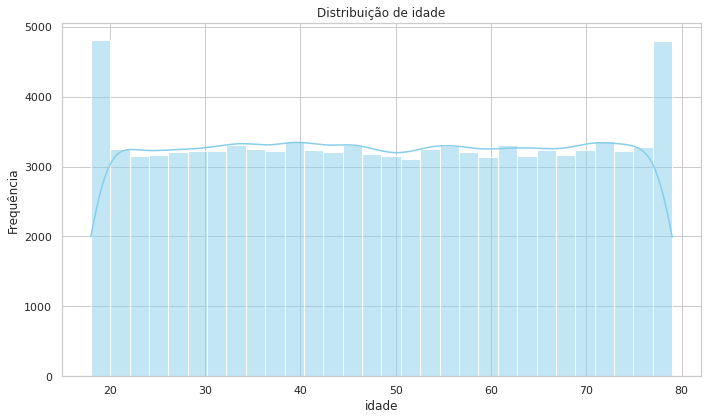

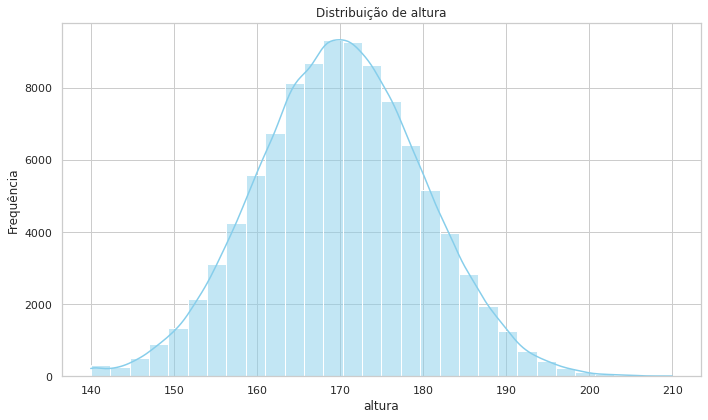

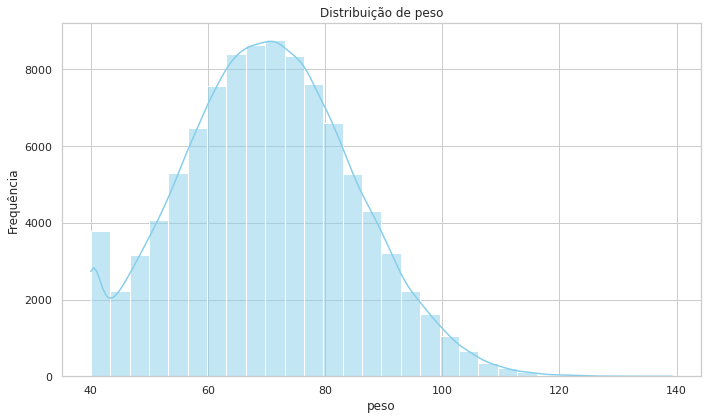

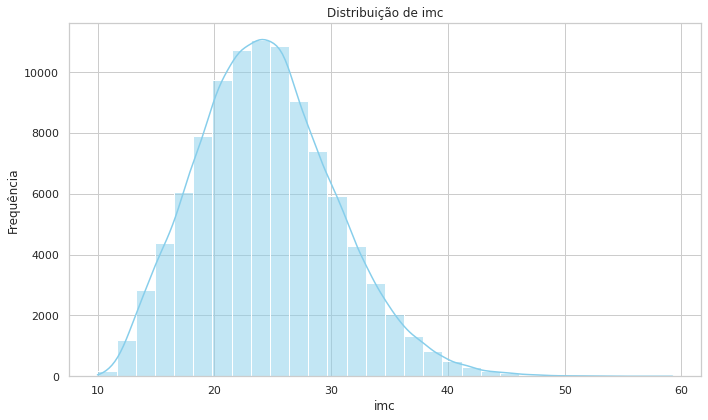

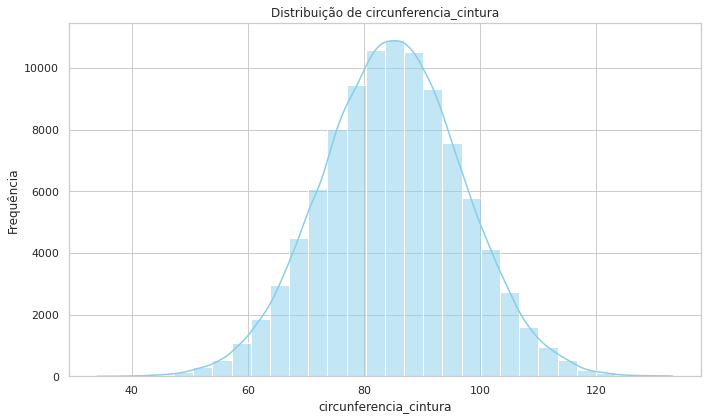

...

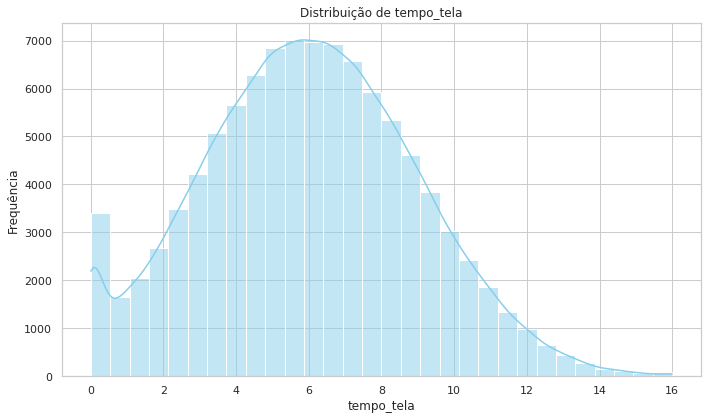

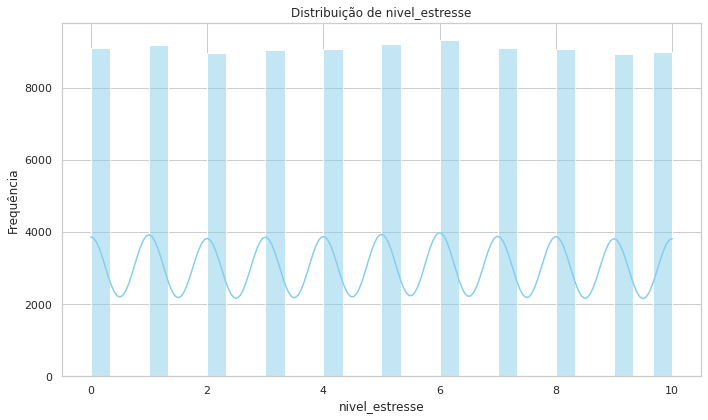

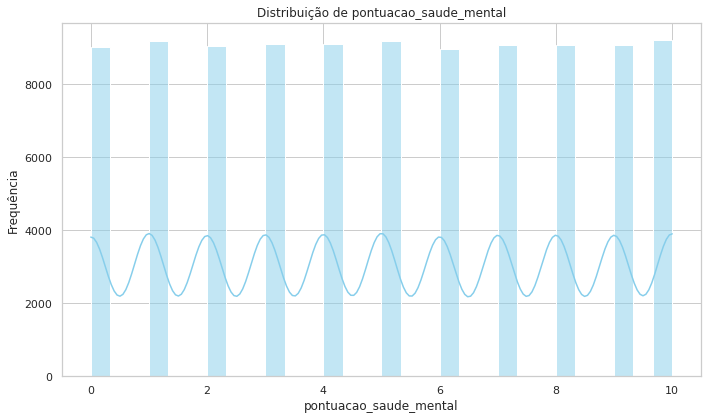

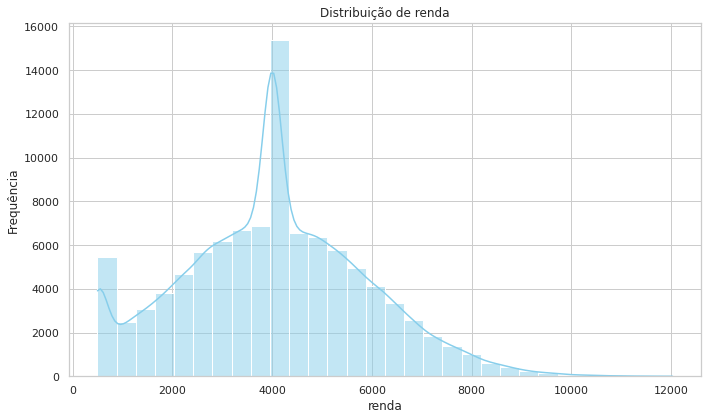

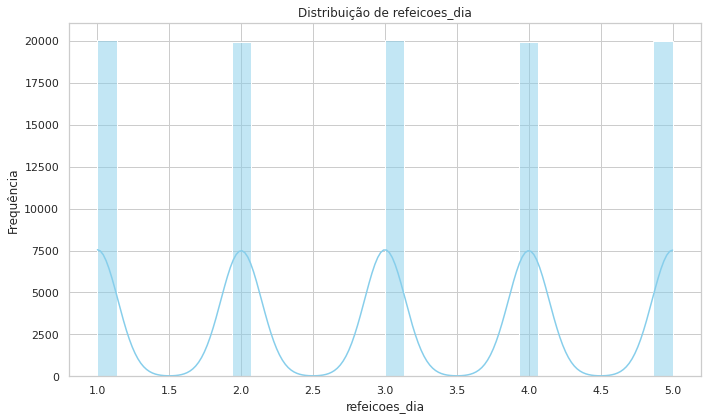

In [0]:
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Frequência')
    plt.tight_layout()
    plt.show()


##4. Análise Exploratória: Relação das Variáveis Numéricas com a Classe Alvo

Nesta etapa, foi realizada uma análise comparativa das distribuições das variáveis numéricas em relação à variável alvo (alvo), que representa a presença ou ausência de risco de doença.

Para isso, foram gerados boxplots para cada variável numérica, segmentados pela classe da variável alvo. Essa abordagem permite visualizar:

Diferenças de tendência central (mediana) entre os grupos (por exemplo, indivíduos doentes vs. saudáveis);

Amplitude dos dados e variabilidade entre as classes;

Presença de outliers por grupo;

Possíveis padrões discriminativos úteis para o modelo preditivo.

O uso de sns.boxplot() do Seaborn com a paleta "Set2" facilitou a distinção visual entre as classes e contribuiu para identificar variáveis com maior potencial de separação entre os grupos, como por exemplo pressão arterial, IMC, colesterol ou glicose.

Esse tipo de análise é fundamental para guiar a seleção de atributos e entender o comportamento das variáveis em relação ao desfecho de interesse.

Pronta para a próx

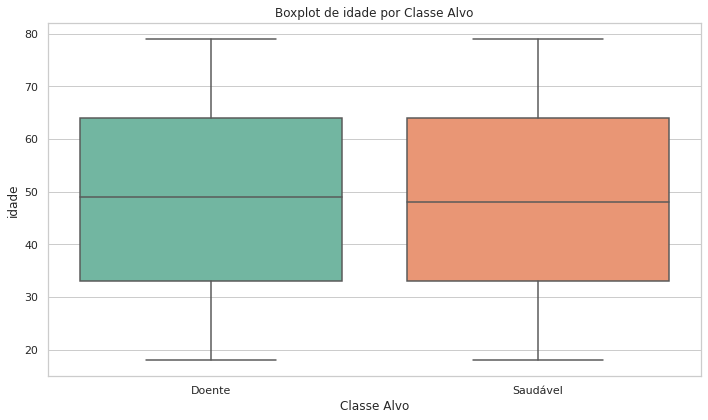

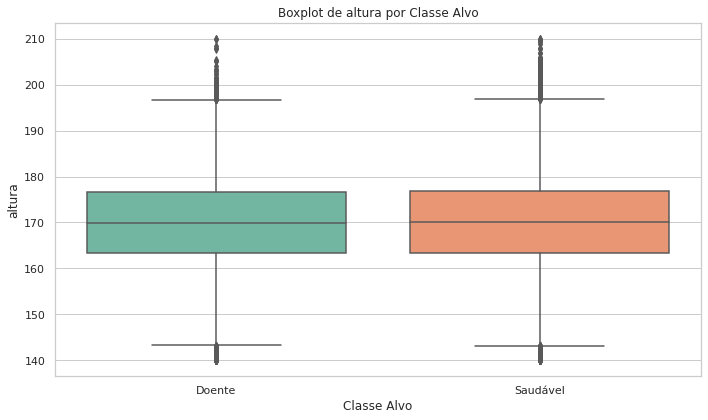

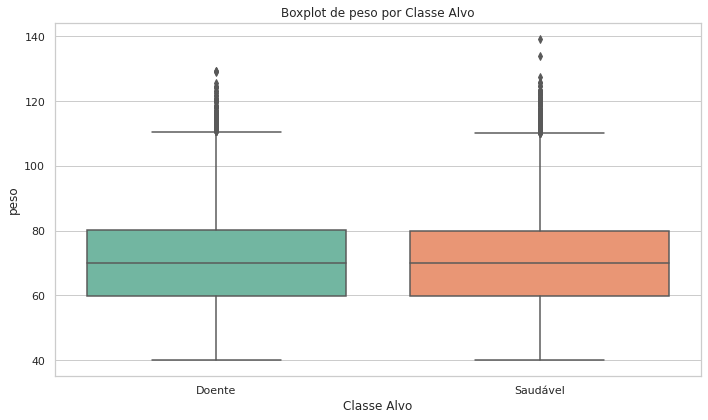

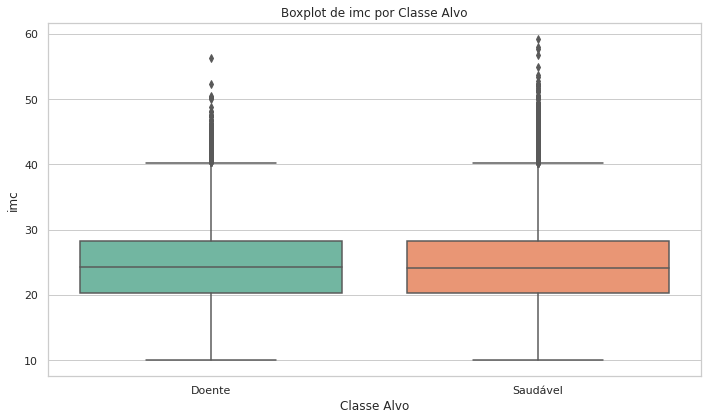

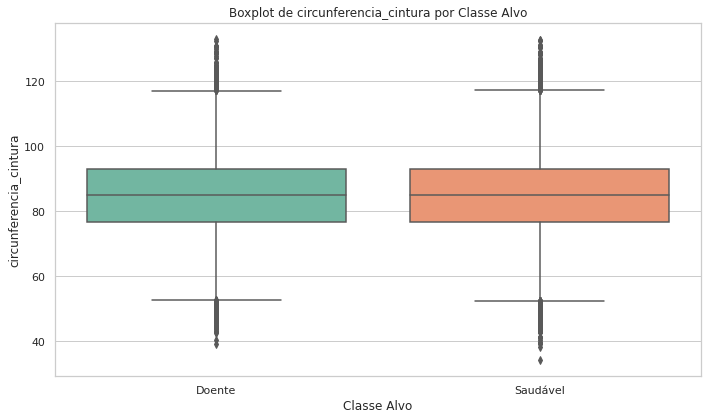

...

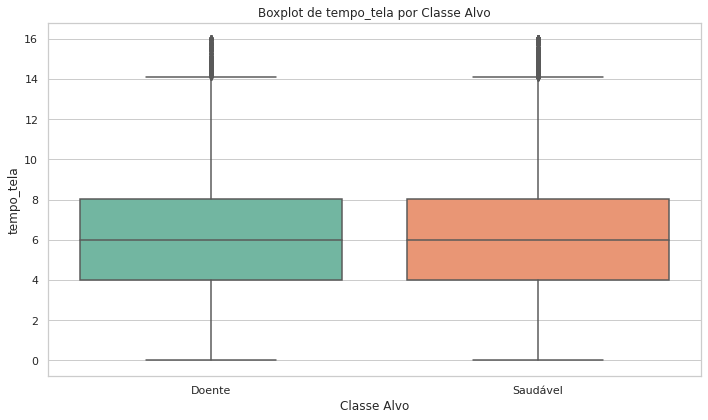

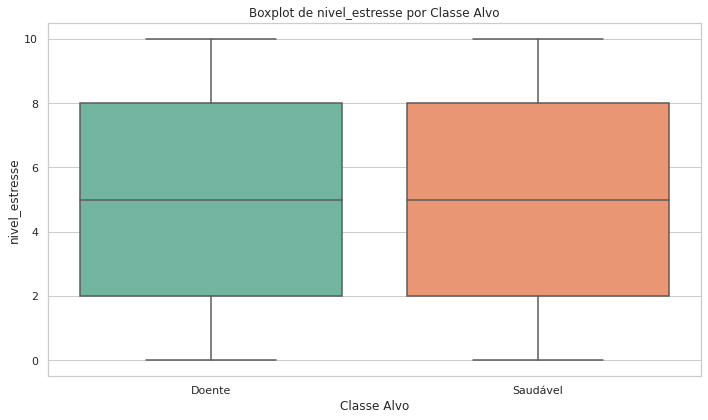

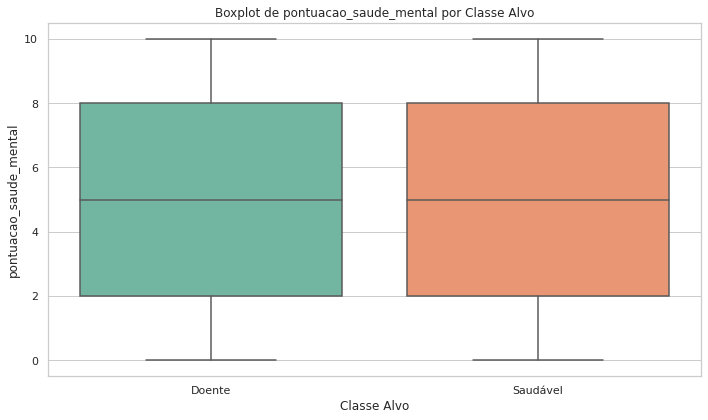

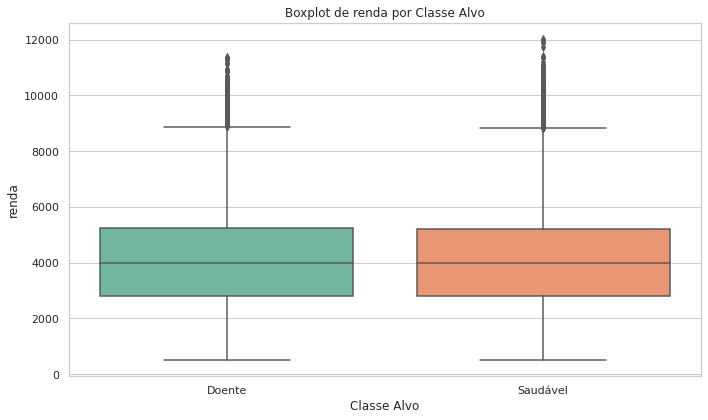

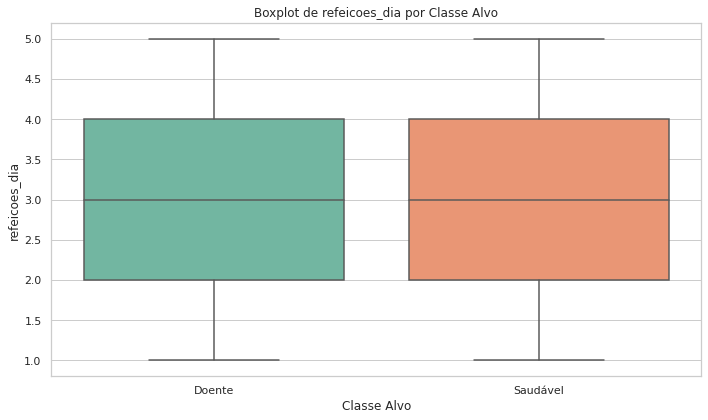

In [0]:
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='alvo', y=col, palette='Set2')  # Substitua 'alvo' pelo nome real da sua coluna alvo, se diferente
    plt.title(f'Boxplot de {col} por Classe Alvo')
    plt.xlabel('Classe Alvo')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()



##5. Análise de Balanceamento da Variável Alvo

Para compreender a distribuição da variável de interesse (alvo), foi gerado um gráfico de contagem (countplot) com a biblioteca Seaborn, permitindo visualizar a proporção entre os dois grupos:

Classe 0 (Saudável)

Classe 1 (Doente)

Esse gráfico é essencial para verificar se o conjunto de dados está balanceado ou desequilibrado, o que pode impactar diretamente na performance de modelos preditivos, especialmente em métricas como recall, precision e F1-score.

Além do gráfico, foram adicionados rótulos com os valores absolutos no topo de cada barra, facilitando a leitura quantitativa da distribuição.

A partir dessa visualização, é possível decidir por estratégias de balanceamento, como:

Oversampling (ex: SMOTE),

Undersampling,

Ou uso de métricas e algoritmos robustos ao desbalanceamento.

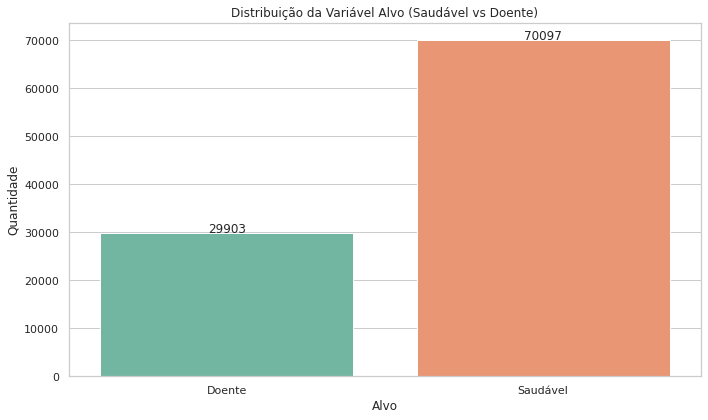

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
ax = sns.countplot(data=df, x='alvo', palette='Set2')

# Adiciona os valores no topo das barras
for p in ax.patches:
    altura = p.get_height()
    ax.text(
        p.get_x() + p.get_width() / 2, 
        altura + 0.5, 
        f'{int(altura)}', 
        ha='center'
    )

plt.title('Distribuição da Variável Alvo (Saudável vs Doente)')
plt.xlabel('Alvo')
plt.ylabel('Quantidade')
plt.tight_layout()
plt.show()


##6. Relação entre Idade e Variáveis Biométricas e Comportamentais por Classe de Risco

Nesta etapa exploratória, buscamos entender como a idade se relaciona com diferentes variáveis biométricas e comportamentais, segmentadas pela variável-alvo (alvo), que representa a classificação se o individuo é saudável ou doente.

Cada gráfico mostra a dispersão entre a idade e uma variável específica (como colesterol, glicose, entre outras), colorida de acordo com a classe de risco. O objetivo é identificar padrões visuais que possam indicar tendências associadas à faixa etária e como essas tendências diferem entre indivíduos classificados como "saudáveis" ou "doentes".

A partir dessas visualizações, é possível observar indícios de correlação em algumas variáveis, como o aumento do colesterol ou glicose com a idade em grupos de risco. Esses padrões visuais são valiosos para orientar a escolha de variáveis preditivas e apoiar a construção de modelos mais interpretáveis e eficazes.



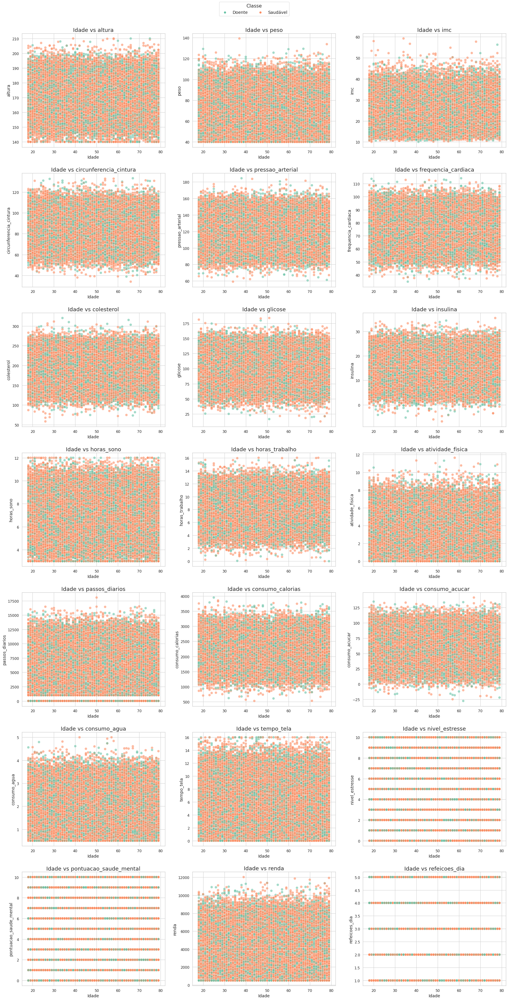

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de variáveis numéricas (exceto idade)
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
numerical_cols = [col for col in numerical_cols if col != 'idade']

# Tamanho da grade
n_cols = 3
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

# Aumenta o tamanho da figura
plt.figure(figsize=(8 * n_cols, 6.5 * n_rows))

# Define estilo do seaborn
sns.set(style='whitegrid', font_scale=2)  # aumenta as fontes

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(
        data=df,
        x='idade',
        y=col,
        hue='alvo',
        palette='Set2',
        s=70,          # aumenta o tamanho dos pontos
        alpha=0.6,
        edgecolor='w'  # borda branca nos pontos
    )
    plt.title(f'Idade vs {col}', fontsize=18)
    plt.xlabel('Idade', fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.tick_params(axis='both', labelsize=12)
    plt.legend().remove()

plt.tight_layout()

# Legenda geral (fora dos subplots)
handles, labels = plt.gca().get_legend_handles_labels()
plt.figlegend(handles, labels, title='Classe', loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=3, fontsize=14, title_fontsize=16)

plt.show()


##7. Tratamento de Valores Inválidos: Remoção de Números Negativos Indevidos

Durante a preparação dos dados, foi realizada uma verificação das colunas numéricas com valores negativos, o que pode indicar erros de entrada ou inconsistências, especialmente para variáveis que naturalmente não podem assumir valores abaixo de zero, como:

Insulina

Consumo de açúcar

Foi utilizado um filtro para identificar todas as colunas numéricas com pelo menos um valor negativo. Em seguida, foi aplicado o método clip(lower=0) para corrigir esses valores, substituindo-os pelo limite inferior (zero), o que mantém a integridade dos dados sem removê-los do dataset.

Esse tipo de limpeza é importante para evitar que valores incoerentes interfiram no desempenho dos modelos e distorçam análises estatísticas.

Por fim, o dataset foi separado em:

valores: contendo as variáveis preditoras (features), com a coluna alvo removida;

alvo: contendo a variável de interesse para a predição.

Se quiser, já podemo

In [0]:
df.head()

,idade,genero,altura,peso,imc,circunferencia_cintura,pressao_arterial,frequencia_cardiaca,colesterol,glicose,...,tipo_exercicio,uso_dispositivos,acesso_saude,seguro_saude,exposicao_sol,refeicoes_dia,consumo_cafeina,historico_familiar,possui_pet,alvo
0,20,Feminino,163.935656,68.102216,25.340454,63.643351,130.202521,93.147148,175.721328,123.271324,...,Nenhum,Baixo,Ruim,Sim,Baixo,2,Moderado,Sim,Não,Doente
1,51,Feminino,167.225807,58.034322,20.752877,91.464137,129.186023,75.244886,222.931911,85.352101,...,Nenhum,Baixo,Bom,Não,Alto,1,Nenhum,Não,Sim,Saudável
2,42,Masculino,172.996183,103.633673,34.628035,78.111844,101.871711,77.170600,182.072778,104.030496,...,Misto,Alto,Moderado,Sim,Baixo,1,Alto,Não,Sim,Saudável
3,43,Feminino,169.875702,56.612918,19.617922,89.649293,106.896753,90.780464,163.086332,79.763274,...,Cardio,Moderado,Moderado,Sim,Moderado,1,Moderado,Não,Sim,Saudável
4,20,Feminino,162.349263,45.230694,17.160605,74.775840,125.510229,75.046211,235.077594,91.971537,...,Nenhum,Baixo,Moderado,Sim,Baixo,1,Alto,Sim,Sim,Saudável


In [0]:
# Seleciona apenas as colunas numéricas
df_numerico = df.select_dtypes(include=['number'])

# Verifica quais colunas têm pelo menos um valor negativo
colunas_negativas = df_numerico.columns[(df_numerico < 0).any()]

print("Colunas com valores negativos:")
print(colunas_negativas)


Colunas com valores negativos:
Index(['insulina', 'consumo_acucar'], dtype='object')


In [0]:
df['insulina'] = df['insulina'].clip(lower=0)
df['consumo_acucar'] = df['consumo_acucar'].clip(lower=0)


In [0]:
valores = df.drop('alvo', axis=1)
alvo = df['alvo']

In [0]:
valores.head()


,idade,genero,altura,peso,imc,circunferencia_cintura,pressao_arterial,frequencia_cardiaca,colesterol,glicose,...,tipo_dieta,tipo_exercicio,uso_dispositivos,acesso_saude,seguro_saude,exposicao_sol,refeicoes_dia,consumo_cafeina,historico_familiar,possui_pet
0,20,Feminino,163.935656,68.102216,25.340454,63.643351,130.202521,93.147148,175.721328,123.271324,...,Onívora,Nenhum,Baixo,Ruim,Sim,Baixo,2,Moderado,Sim,Não
1,51,Feminino,167.225807,58.034322,20.752877,91.464137,129.186023,75.244886,222.931911,85.352101,...,Cetogênica,Nenhum,Baixo,Bom,Não,Alto,1,Nenhum,Não,Sim
2,42,Masculino,172.996183,103.633673,34.628035,78.111844,101.871711,77.170600,182.072778,104.030496,...,Vegana,Misto,Alto,Moderado,Sim,Baixo,1,Alto,Não,Sim
3,43,Feminino,169.875702,56.612918,19.617922,89.649293,106.896753,90.780464,163.086332,79.763274,...,Onívora,Cardio,Moderado,Moderado,Sim,Moderado,1,Moderado,Não,Sim
4,20,Feminino,162.349263,45.230694,17.160605,74.775840,125.510229,75.046211,235.077594,91.971537,...,Vegana,Nenhum,Baixo,Moderado,Sim,Baixo,1,Alto,Sim,Sim


##8. Codificação de Variáveis Categóricas (One-Hot Encoding)

Nesta fase, o foco foi preparar as variáveis categóricas para o uso em algoritmos de machine learning, que requerem que todos os dados estejam em formato numérico.

Passos Realizados:
Identificação das colunas categóricas:
Uma lista de colunas com dados qualitativos foi definida manualmente com base no entendimento do domínio. Essas variáveis representam características como:

Gênero

Tipo de dieta

Ocupação

Qualidade do sono

Consumo de álcool, entre outras.

Transformação com One-Hot Encoding:
Utilizou-se o make_column_transformer do sklearn.compose com a estratégia de OneHotEncoder(drop='if_binary'), que:

Transforma cada categoria em uma nova coluna binária;

Evita multicolinearidade ao descartar uma coluna se a variável tiver apenas dois valores (binária);

Mantém todas as demais colunas numéricas com remainder='passthrough'.

Aplicação do transformador aos dados (fit_transform)
O DataFrame de atributos (valores) foi transformado e convertido para um novo DataFrame codificado (df_encoded) com as colunas renomeadas corretamente por meio do get_feature_names_out().

Resultado:
O dataset agora contém apenas valores numéricos, sendo uma combinação das variáveis originais contínuas e das variáveis categóricas codificadas. Essa estrutura é apropriada para alimentar modelos supervisionados de classificação, como regressão logística, árvore de decisão, XGBoost, entre outros.

In [0]:
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(categorical_cols)


['genero', 'qualidade_sono', 'consumo_alcool', 'nivel_tabagismo', 'apoio_saude_mental', 'nivel_educacional', 'tipo_emprego', 'ocupacao', 'tipo_dieta', 'tipo_exercicio', 'uso_dispositivos', 'acesso_saude', 'seguro_saude', 'exposicao_sol', 'consumo_cafeina', 'historico_familiar', 'possui_pet', 'alvo']


In [0]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder


In [0]:
colunas = valores.columns

In [0]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder

categorical_cols = [
    'genero', 'qualidade_sono', 'consumo_alcool', 'nivel_tabagismo',
    'apoio_saude_mental', 'nivel_educacional', 'tipo_emprego', 'ocupacao',
    'tipo_dieta', 'tipo_exercicio', 'uso_dispositivos', 'acesso_saude',
    'seguro_saude', 'exposicao_sol', 'consumo_cafeina', 'historico_familiar', 'possui_pet'
]

one_hot = make_column_transformer(
    (OneHotEncoder(drop='if_binary'), categorical_cols),
    remainder='passthrough',
    sparse_threshold=0
)


In [0]:
valores = one_hot.fit_transform(valores)

In [0]:
nomes_colunas = one_hot.get_feature_names_out(colunas)

In [0]:
df_encoded = pd.DataFrame(valores,columns=one_hot.get_feature_names_out(colunas))
df_encoded.head()

,onehotencoder__genero_Masculino,onehotencoder__qualidade_sono_Boa,onehotencoder__qualidade_sono_Excelente,onehotencoder__qualidade_sono_Razoável,onehotencoder__qualidade_sono_Ruim,onehotencoder__consumo_alcool_Nenhum,onehotencoder__consumo_alcool_Não informado,onehotencoder__consumo_alcool_Ocasionalmente,onehotencoder__consumo_alcool_Regularmente,onehotencoder__nivel_tabagismo_Fumante intenso,...,remainder__atividade_fisica,remainder__passos_diarios,remainder__consumo_calorias,remainder__consumo_acucar,remainder__consumo_agua,remainder__tempo_tela,remainder__nivel_estresse,remainder__pontuacao_saude_mental,remainder__renda,remainder__refeicoes_dia
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.628281,7343.265812,2070.389856,42.035074,1.271748,8.181878,1.0,2.0,1771.488017,2.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,2.057273,8868.796793,2053.533534,50.645296,1.991078,1.833148,1.0,6.0,4004.601345,1.0
2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,4.707310,7797.630983,2415.558061,57.176618,1.754794,2.284414,4.0,1.0,1098.927409,1.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,4.267624,9347.500745,2624.059301,56.248286,1.943963,11.316018,6.0,1.0,4663.448635,1.0
4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2.781728,5943.842877,2235.930238,88.353597,2.535567,5.860647,1.0,8.0,1006.816210,1.0


##9. Codificação da Variável Alvo (Label Encoding)
Nesta etapa, a variável alvo, originalmente categórica com os rótulos 'Saudável' e 'Doente', foi transformada em valores numéricos binários utilizando o LabelEncoder do sklearn.preprocessing.

Passos realizados:
Foi aplicada a codificação:

label_encoder = LabelEncoder()
alvo = label_encoder.fit_transform(alvo)
Com isso, a variável alvo passou a ter os valores:

'Doente'   → 0  
'Saudável' → 1

Essa codificação foi também adicionada diretamente ao DataFrame original:

df['alvo_encoded'] = le.fit_transform(df['alvo'])
Foi verificada a distribuição original da variável:

df['alvo'].value_counts()

**Saudável: 70.097 (≈70%)**

**Doente: 29.903 (≈30%)**

Isso confirmou o desbalanceamento de classes, o que será tratado nas etapas de modelagem ou avaliação.


In [0]:
from sklearn.preprocessing import LabelEncoder

In [0]:
label_encoder = LabelEncoder()

In [0]:
alvo = label_encoder.fit_transform(alvo)

In [0]:
alvo

Out[67]: array([0, 1, 1, ..., 0, 0, 1])

In [0]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['alvo_encoded'] = le.fit_transform(df['alvo'])

# Ver os mapeamentos:
list(le.classes_)


Out[68]: ['Doente', 'Saudável']

In [0]:
df['alvo'].value_counts()


Out[69]: Saudável    70097
Doente      29903
Name: alvo, dtype: int64

In [0]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(df['alvo'])

print(dict(zip(le.classes_, le.transform(le.classes_))))

{'Doente': 0, 'Saudável': 1}


##10. Divisão do Dataset em Conjunto de Treino e Teste

Para avaliar corretamente o desempenho do modelo preditivo, o dataset foi dividido em dois conjuntos:

Treino (70%) — usado para ajustar o modelo;

Teste (30%) — usado para avaliação final do desempenho.

Foi utilizado o train_test_split do sklearn.model_selection com a semente fixa (SEED = 133564) para garantir reprodutibilidade da divisão.

In [0]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from numpy import random

In [0]:
SEED = 133564
random.seed(SEED)

# Split dos dados com estratificação (recomendado em bases desbalanceadas)
treino_x, teste_x, treino_y, teste_y = train_test_split(
    valores, alvo, test_size=0.3, stratify=alvo, random_state=SEED
)

# Aplicar SMOTE apenas no treino
smote = SMOTE(random_state=SEED)
treino_x_bal, treino_y_bal = smote.fit_resample(treino_x, treino_y)

In [0]:
treino_y

Out[74]: array([1, 1, 1, ..., 1, 1, 1])

##11. Seleção das Melhores Variáveis (Feature Selection) com SelectKBest e Qui-Quadrado
Para reduzir dimensionalidade e focar nas variáveis mais relevantes para a classificação, foi aplicada a técnica:

SelectKBest com a métrica qui-quadrado (chi2), que mede a dependência entre cada variável e a variável alvo;

Selecionou as 10 melhores variáveis (k=10), facilitando a interpretação e podendo melhorar a generalização.

A transformação foi feita apenas nos dados de treino para evitar vazamento de dados (data leakage), e depois aplicada ao conjunto de teste.

In [0]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
import random
import pandas as pd
import numpy as np


In [0]:

SEED = 133564
random.seed(SEED)

treino_x, teste_x, treino_y, teste_y = train_test_split(valores, alvo,
                                                        test_size=0.3,
                                                        stratify=alvo,  
                                                        random_state=SEED)

# Seleção de variáveis - 
melhores_features = SelectKBest(score_func=f_classif, k=10)
treino_kbest = melhores_features.fit_transform(treino_x, treino_y)
teste_kbest = melhores_features.transform(teste_x)

# Aplica SMOTE para balancear apenas o conjunto de treino
smote = SMOTE(random_state=SEED)
treino_kbest_balanceado, treino_y_balanceado = smote.fit_resample(treino_kbest, treino_y)


##12. Treinamento e Avaliação do Modelo Random Forest

Foi escolhido um classificador Random Forest com 100 árvores (n_estimators=100), conhecido por ser robusto e eficiente em problemas de classificação com variáveis misturadas.

O modelo foi treinado com o conjunto reduzido (treino_kbest) e avaliado no conjunto de teste correspondente.

O score impresso corresponde à acurácia do modelo, ou seja, a proporção de classificações corretas no conjunto de teste.

In [0]:
from sklearn.ensemble import RandomForestClassifier


In [0]:
classificador = RandomForestClassifier(n_estimators=100, random_state=42)
classificador.fit(treino_kbest, treino_y)
print("Resultado score %.2f%%" %(classificador.score(teste_kbest, teste_y)*100))

Resultado score 67.36%


##13. Matriz de confusão

In [0]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score 
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
import pandas as pd

In [0]:
##Previsoes do modelo
y_pred = classificador.predict(teste_kbest)

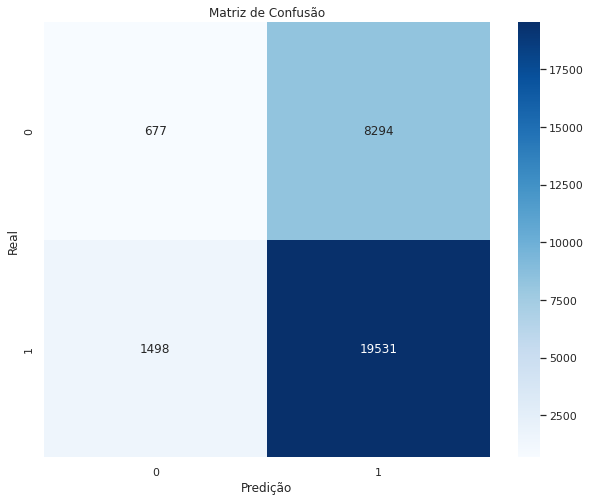

In [0]:
##Matriz de confusão
matriz_confusao = confusion_matrix(teste_y, y_pred)

plt.figure(figsize=(10,8))
sns.set(font_scale=1) 
sns.heatmap(matriz_confusao, annot=True, fmt="d", cmap='Blues')
plt.xlabel("Predição") 
plt.ylabel("Real") 
plt.title("Matriz de Confusão") 
plt.show()

In [0]:
#Importancia das festures
acuracia = accuracy_score(teste_y, y_pred) 
recall = recall_score(teste_y, y_pred)

print(f"Acurácia: {acuracia:.4f}")
print(f"Recall: {recall:.4f}")

Acurácia: 0.6736
Recall: 0.9288


##14. Treinamento do Modelo com Todas as Variáveis (Random Forest sem Seleção de Atributos)
Após testar a Random Forest com as 10 melhores variáveis selecionadas, foi realizada uma nova abordagem sem redução de dimensionalidade, ou seja, utilizando todas as variáveis disponíveis no conjunto transformado (treino_x e teste_x), já codificadas e tratadas.

O modelo RandomForestClassifier foi treinado com 100 estimadores (n_estimators=100) e avaliado com o conjunto de teste.
O objetivo aqui foi verificar se manter todas as variáveis traria desempenho superior ao modelo com apenas as 10 selecionadas via SelectKBest

In [0]:
from sklearn.ensemble import RandomForestClassifier

classificador = RandomForestClassifier(n_estimators = 100)
classificador.fit(treino_x, treino_y)
print("Resultado %.2f%%" %(classificador.score(teste_x, teste_y)*100))

Resultado 70.08%


##15. Criação de um Modelo de Referência (Baseline) com DummyClassifier
Para avaliar se o modelo de Random Forest realmente está aprendendo padrões úteis, foi utilizado o DummyClassifier como modelo de comparação (baseline). Esse classificador não aprende nada dos dados, apenas aplica uma regra simples — no caso, a previsão sempre pela classe mais frequente (strategy="most_frequent"), que corresponde à classe majoritária no treino.

A performance do modelo Random Forest deve superar significativamente essa baseline para ser considerado útil. Isso é especialmente importante em contextos com classes desbalanceadas.

In [0]:
from sklearn.dummy import DummyClassifier

In [0]:
dummy = DummyClassifier()

In [0]:
dummy.fit(x_treino, y_treino)

dummy.score(x_teste, y_teste)

Out[88]: 0.7009666666666666

In [0]:
from sklearn.dummy import DummyClassifier

SEED = 133564
random.seed(SEED)

classificador_dom = DummyClassifier(strategy="most_frequent")
classificador_dom.fit(treino_x, treino_y)
print("Resultado dom %.2f%%" %(classificador_dom.score(teste_x, teste_y)*100))

Resultado dom 70.10%


##16.Modelagem e Previsão com Árvore de Decisão
A escolha de uma Árvore de Decisão é excelente para este problema, pois permite visualizar as regras que o modelo criou para classificar os pacientes.

Configurações do Modelo

max_depth = 12 → Limita a profundidade da árvore, ajudando a evitar overfitting.

min_samples_leaf = 15 → Cada nó terminal (folha) precisa de pelo menos 20 amostras.

min_samples_split = 20 → Cada divisão de nó só ocorre se houver pelo menos 30 amostras.

random_state = 42 → Reprodutibilidade dos resultados.

In [0]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:

# Split com estratificação
treino_x, teste_x, treino_y, teste_y = train_test_split(
    valores, alvo, stratify=alvo, test_size=0.3, random_state=42
)

In [0]:
# Aplicarndo SMOTE no conjunto de treino
smote = SMOTE(random_state=42)
treino_x_res, treino_y_res = smote.fit_resample(treino_x, treino_y)

In [0]:
# Instanciando a árvore
arvore = DecisionTreeClassifier(
    max_depth=12,
    min_samples_leaf=15,
    min_samples_split=20,
    random_state=42
)

In [0]:
arvore.fit(treino_x_res, treino_y_res)
y_pred = arvore.predict(teste_x)

In [0]:
 #5. Avaliação
print("Acurácia:", accuracy_score(teste_y, y_pred))
print("Recall:", recall_score(teste_y, y_pred))
print("\nRelatório de Classificação:\n", classification_report(teste_y, y_pred, target_names=['Doente', 'Saudável']))


Acurácia: 0.6807333333333333
Recall: 0.9515906605164297

Relatório de Classificação:
               precision    recall  f1-score   support

      Doente       0.29      0.05      0.08      8971
    Saudável       0.70      0.95      0.81     21029

    accuracy                           0.68     30000
   macro avg       0.49      0.50      0.44     30000
weighted avg       0.58      0.68      0.59     30000



In [0]:
# Treinando o modelo
arvore.fit(treino_x, treino_y)

# Previsões
y_pred = arvore.predict(teste_x)

In [0]:
# Treinamento
arvore.fit(treino_x, treino_y)

# Score no treino e teste
score_treino = arvore.score(treino_x, treino_y)
score_teste = arvore.score(teste_x, teste_y)

print(f"Acurácia no treino: {score_treino:.4f}")
print(f"Acurácia no teste:  {score_teste:.4f}")

Acurácia no treino: 0.7158
Acurácia no teste:  0.6783


In [0]:
# Avaliação
acuracia = accuracy_score(teste_y, y_pred)
recall = recall_score(teste_y, y_pred, pos_label=1)

print(f"Acurácia: {acuracia:.4f}")
print(f"Recall: {recall:.4f}")


Acurácia: 0.6783
Recall: 0.9446


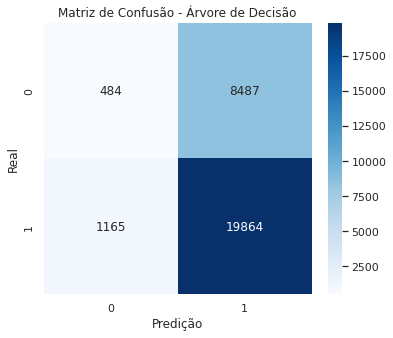

In [0]:
# Matriz de confusão
matriz = confusion_matrix(teste_y, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(matriz, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predição")
plt.ylabel("Real")
plt.title("Matriz de Confusão - Árvore de Decisão")
plt.show()



In [0]:
#Plot da análise descritiva da Árvore de Decisão
from sklearn.tree import export_text

# Gerar nomes das variáveis codificadas
feature_names = list(one_hot.get_feature_names_out(colunas))

# Exportar árvore em formato textual
regras_texto = export_text(
    decision_tree=arvore,
    feature_names=feature_names,
    show_weights=True
)

# Exibir no console
print("Regras da Árvore de Decisão:")
print(regras_texto)


Regras da Árvore de Decisão:
|--- remainder__horas_trabalho <= 8.09
|   |--- remainder__consumo_agua <= 2.51
|   |   |--- remainder__consumo_acucar <= 121.85
|   |   |   |--- remainder__circunferencia_cintura <= 67.20
|   |   |   |   |--- remainder__pressao_arterial <= 87.41
|   |   |   |   |   |--- remainder__consumo_agua <= 1.82
|   |   |   |   |   |   |--- weights: [7.00, 10.00] class: 1
|   |   |   |   |   |--- remainder__consumo_agua >  1.82
|   |   |   |   |   |   |--- weights: [12.00, 3.00] class: 0
|   |   |   |   |--- remainder__pressao_arterial >  87.41
|   |   |   |   |   |--- remainder__circunferencia_cintura <= 67.14
|   |   |   |   |   |   |--- onehotencoder__acesso_saude_Bom <= 0.50
|   |   |   |   |   |   |   |--- remainder__frequencia_cardiaca <= 61.50
|   |   |   |   |   |   |   |   |--- remainder__insulina <= 16.07
|   |   |   |   |   |   |   |   |   |--- remainder__insulina <= 12.67
|   |   |   |   |   |   |   |   |   |   |--- weights: [5.00, 15.00] class: 1
|   |  

Com base nas regras da árvore de decisão , e considerando o mapeamento **'Doente': 0, 'Saudável': 1**, podemos identificar as principais features que a árvore usa para fazer suas classificações.

As features mais importantes são aquelas que aparecem nos nós mais altos da árvore, pois elas são as primeiras a serem avaliadas e dividem o conjunto de dados em grandes grupos.

**Principais Features da Sua Árvore de Decisão**
Analisando a estrutura da árvore, as seguintes features se destacam nas decisões:

**horas_trabalho**: Esta é a feature mais importante, pois é a primeira condição no topo da árvore é horas_trabalho <= 8.09. Isso significa que a quantidade de horas trabalhadas é o fator inicial mais decisivo para separar os grupos de indivíduos.

**consumo_agua:** Imediatamente após a divisão por horas de trabalho, o consumo de água se torna uma feature crítica em ambos os principais ramos (consumo_agua <= 2.51 e consumo_agua >  2.51). Isso indica que a ingestão de água tem um papel significativo na ramificação das decisões.

**consumo_acucar**: Nos ramos subsequentes, o consumo de açúcar aparece como uma divisão importante, especialmente no caminho onde consumo_agua é menor ou igual a 2.51 (consumo_acucar <= 121.85).

**circunferencia_cintura**: Essa feature é crucial em várias profundidades da árvore, aparecendo logo após o consumo de açúcar em um caminho principal (circunferencia_cintura <= 67.20). Ela também se repete em outros ramos mais profundos, reforçando sua relevância.

**pressao_arterial:** No ramo onde a circunferência da cintura é baixa, a pressão arterial surge como um critério de divisão importante (pressao_arterial <= 87.41).

**idade**:Embora apareça um pouco mais profundamente, a idade é utilizada em várias ramificações para refinar as previsões, especialmente em caminhos onde pressao_arterial é alta (idade <= 45.00).

**insulina:** A insulina é outra feature que surge em nós mais profundos, mas com um impacto notável, como em insulina <= 16.07, especialmente em caminhos relacionados a pressão arterial e frequência cardíaca.

**consumo_calorias:** Essa variável é importante em um dos grandes ramos, aparecendo como um critério chave para divisão: consumo_calorias <= 2432.02.

**Entendendo a Importância**

As features listadas acima são as que a árvore de decisão considerou mais relevantes para separar os indivíduos entre "Doente" (Classe 0) e "Saudável" (Classe 1). As variáveis que aparecem mais cedo e em mais caminhos da árvore geralmente têm maior poder discriminatório.

É importante notar que, como sua árvore é bem profunda e possui muitos ramos truncados, há muitas outras features que contribuem para as decisões em níveis mais específicos. No entanto, as mencionadas são as que ditam as principais divisões do seu modelo.

##17.Principais insigths

Com base nas análises realizadas podemos sugerir como principais fatores de classificação de um individuo Saudável horas trabalhadas, consumo de água, circinferencia da cintura, pressão arterial, nível de insulina e consumo de calorias.
Como pontos de destqque estão:

Horas de Trabalho: Indivíduos Doentes exibem uma tendência a ter maior número de horas de trabalho, enquanto os Saudáveis se concentram em jornadas de trabalho mais curtas ou ausentes. Isso pode apontar para um esgotamento ou estresse relacionado ao trabalho em indivíduos doentes, ou que a condição de saúde não impede o trabalho intenso, diferentemente do esperado em muitos contextos.

Consumo de Água: Curiosamente, o consumo de água é visivelmente maior entre os indivíduos Doentes. Esta associação inusitada pode sugerir que o aumento da ingestão de água é uma resposta ou sintoma de certas condições de doença (ex: febre, desidratação associada a outras doenças) e não necessariamente um fator de hábito.

Identificar individuos saudavéis ou doentes por meio de hábitos é desafiador, pois não há fatores decisivos ou individuais, são diferentes e distintos hábitos que podem estar associados ou leva um indívido ao estado de doente ou saudável.

